In [1]:
from src.utils.dataset import *
from sklearn.cluster import MeanShift, estimate_bandwidth
import numpy as np
from sklearn.datasets import fetch_20newsgroups, fetch_20newsgroups_vectorized
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.manifold import TSNE

%load_ext autoreload
%autoreload 2

In [2]:
def perform_meanshift(dataset, quantile, bin_seeding=True):
    _, ax = plt.subplots(nrows=1, ncols=1)
    print("quantile:", quantile)
    bandwidth = estimate_bandwidth(dataset, quantile=quantile, n_samples=500)
    print("bandwitch:", bandwidth)
    labels = MeanShift(bandwidth=bandwidth, bin_seeding=bin_seeding).fit(dataset).labels_
    print("clusters:", len(np.unique(labels)))
    visualize(dataset, labels, ax=ax)
    plt.show()

quantile: 0.3
bandwitch: 146.40087619885418
clusters: 2


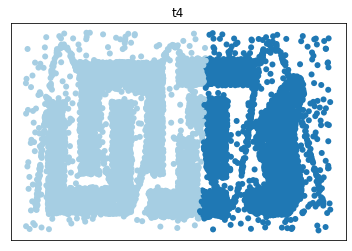

quantile: 0.2
bandwitch: 112.2680615061603
clusters: 3


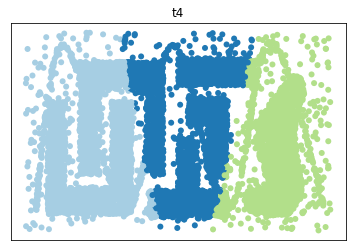

quantile: 0.1
bandwitch: 71.84656846191359
clusters: 6


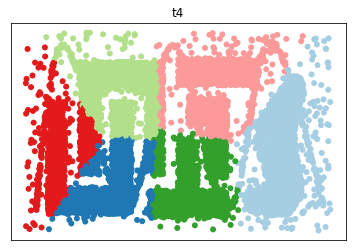

In [3]:
perform_meanshift(load('t4.8k.txt'), quantile=0.3)
perform_meanshift(load('t4.8k.txt'), quantile=0.2)
perform_meanshift(load('t4.8k.txt'), quantile=0.1)

quantile: 0.3
bandwitch: 322934.57829352986
clusters: 1


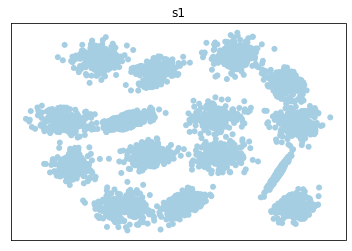

quantile: 0.2
bandwitch: 258330.3464644497
clusters: 3


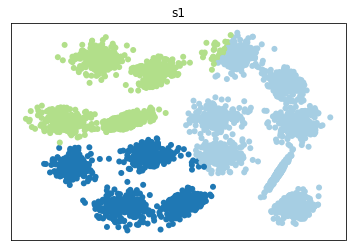

quantile: 0.05
bandwitch: 64188.48401419818
clusters: 15


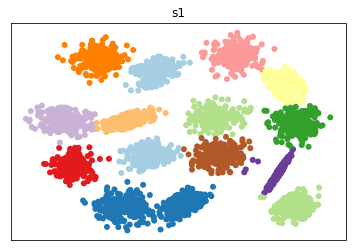

In [4]:
perform_meanshift(load('s1.txt'), quantile=0.3)
perform_meanshift(load('s1.txt'), quantile=0.2)
perform_meanshift(load('s1.txt'), quantile=0.05)

quantile: 0.3
bandwitch: 29306.068793651608
clusters: 7


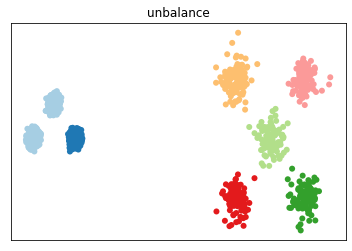

quantile: 0.2
bandwitch: 25224.763216240728
clusters: 8


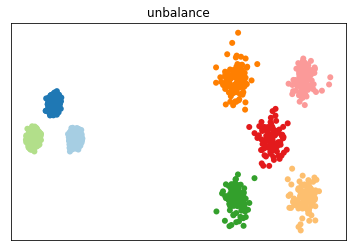

quantile: 0.1
bandwitch: 22969.43817839702
clusters: 8


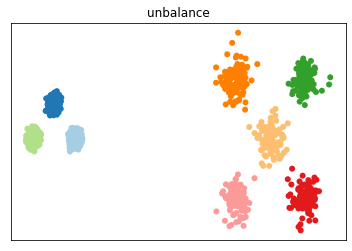

In [5]:
perform_meanshift(load('unbalance.txt'), quantile=0.3)
perform_meanshift(load('unbalance.txt'), quantile=0.2)
perform_meanshift(load('unbalance.txt'), quantile=0.1)

quantile: 0.3
bandwitch: 55703.422467406504
clusters: 1


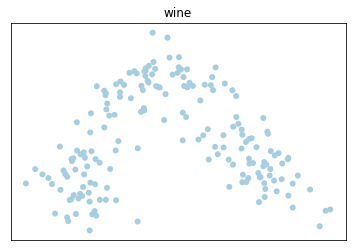

quantile: 0.2
bandwitch: 47610.37736910641
clusters: 2


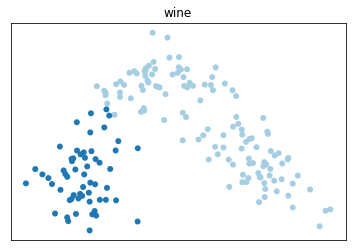

quantile: 0.1
bandwitch: 39929.757008738314
clusters: 5


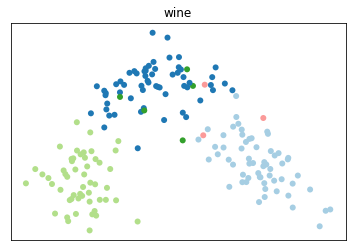

In [6]:
perform_meanshift(load('wine.txt'), quantile=0.3)
perform_meanshift(load('wine.txt'), quantile=0.2)
perform_meanshift(load('wine.txt'), quantile=0.1)

quantile: 0.5
bandwitch: 8.262361522490183
clusters: 4


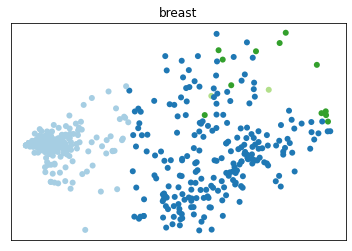

quantile: 0.3
bandwitch: 6.5087471053619
clusters: 8


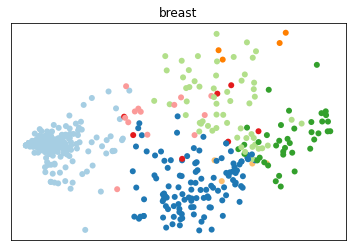

quantile: 0.2
bandwitch: 5.661144406823602
clusters: 31


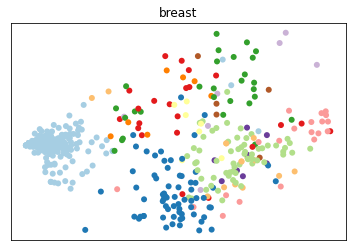

In [7]:
perform_meanshift(load('breast.txt'), quantile=0.5)
perform_meanshift(load('breast.txt'), quantile=0.3)
perform_meanshift(load('breast.txt'), quantile=0.2)

quantile: 0.3
bandwitch: 1604129.5778266825
clusters: 2


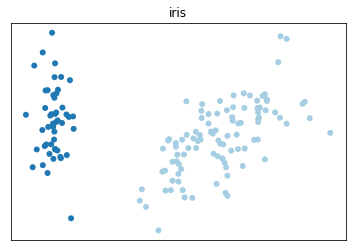

quantile: 0.1
bandwitch: 850699.1805042702
clusters: 7


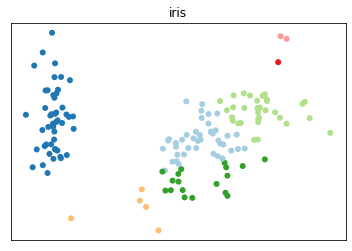

In [8]:
perform_meanshift(load('iris.txt'), quantile=0.3)
perform_meanshift(load('iris.txt'), quantile=0.1)

quantile: 0.2
bandwitch: 561.9471648128049
clusters: 1


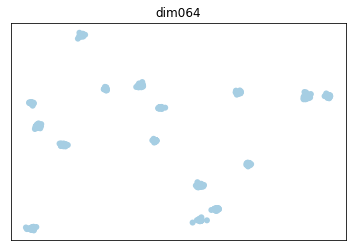

quantile: 0.06
bandwitch: 165.3699738312646
clusters: 16


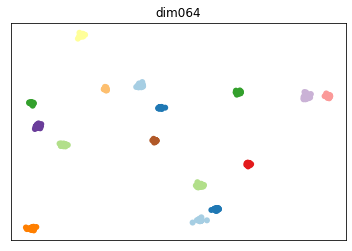

quantile: 0.05
bandwitch: 43.705228751210115
clusters: 20


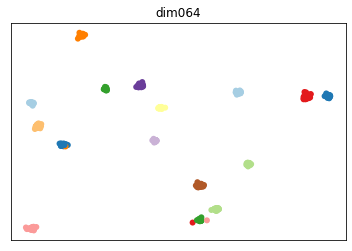

In [9]:
perform_meanshift(load('dim064.txt'), quantile=0.2, bin_seeding=False)
perform_meanshift(load('dim064.txt'), quantile=0.06, bin_seeding=False)
perform_meanshift(load('dim064.txt'), quantile=0.05, bin_seeding=False)

In [10]:
newsgroups = fetch_20newsgroups(subset='all', shuffle=True, download_if_missing=False)
newsgroups_texts = newsgroups.data
newsgroups_labels_true = newsgroups.target

In [11]:
newsgroups_vectorized = \
    TfidfVectorizer(stop_words='english') \
        .fit_transform(newsgroups_texts) \
        .astype(np.float32)

In [12]:
newsgroups_2d = TSNE(n_components=2).fit_transform(newsgroups_vectorized)

clusters: 16


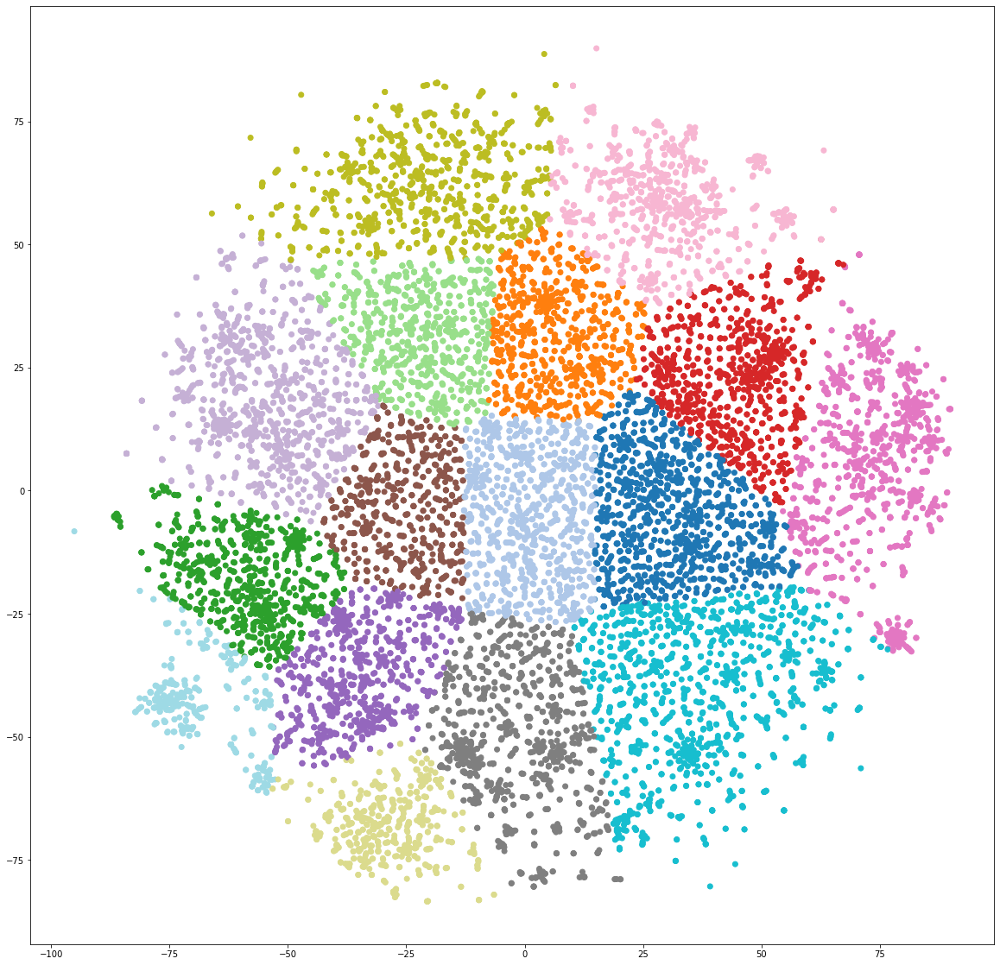

In [13]:
bandwidth = estimate_bandwidth(newsgroups_2d, quantile=0.03, n_samples=5000)
labels = MeanShift(bandwidth, bin_seeding=True).fit(newsgroups_2d).labels_
print("clusters:", len(np.unique(labels)))
plt.figure(figsize=(20,20))
plt.scatter(newsgroups_2d[:,0], newsgroups_2d[:,1], c=labels, cmap='tab20')